<a href="https://colab.research.google.com/github/akimi-yano/Aerial_Drone_Image_Semantic_Segmentation/blob/main/Aerial_Drone_Image_Semantic_Segmentation_PyTorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import kagglehub
kagglehub.login()

Kaggle credentials set.
Kaggle credentials successfully validated.


In [3]:
opencv_pytorch_segmentation_project_round2_path = kagglehub.competition_download('opencv-pytorch-segmentation-project-round2')
print('Data source import complete.')

100%|██████████| 738M/738M [00:35<00:00, 21.6MB/s]

Extracting files...


Data source import complete.


In [1]:
from google.colab import files
files.upload()

{}

In [5]:
!mkdir -p ~/.kaggle

In [6]:
!cp kaggle.json ~/.kaggle/

In [7]:
!ls ~/.kaggle

kaggle.json


In [8]:
!chmod 600 /root/.kaggle/kaggle.json

In [9]:
! kaggle competitions download -c opencv-pytorch-segmentation-project-round2

 89% 656M/738M [00:00<00:00, 1.38GB/s]
100% 738M/738M [00:00<00:00, 1.37GB/s]


In [10]:
!unzip opencv-pytorch-segmentation-project-round2.zip -d dataset/

Streaming output truncated to the last 5000 lines.
  inflating: dataset/imgs/imgs/14573883420252720351.jpg  
  inflating: dataset/imgs/imgs/14576396651490455881.jpg  
  inflating: dataset/imgs/imgs/14586144722971078130.jpg  
  inflating: dataset/imgs/imgs/14612705890207745237.jpg  
  inflating: dataset/imgs/imgs/1461699196221936164.jpg  
  inflating: dataset/imgs/imgs/14616994079524861520.jpg  
  inflating: dataset/imgs/imgs/1462596385887731109.jpg  
  inflating: dataset/imgs/imgs/14631365479183100385.jpg  
  inflating: dataset/imgs/imgs/14632506498851821566.jpg  
  inflating: dataset/imgs/imgs/14633513300500258298.jpg  
  inflating: dataset/imgs/imgs/1463632710523204819.jpg  
  inflating: dataset/imgs/imgs/14639491583176508727.jpg  
  inflating: dataset/imgs/imgs/14652342528123747940.jpg  
  inflating: dataset/imgs/imgs/14653338023367921541.jpg  
  inflating: dataset/imgs/imgs/14655694621434073726.jpg  
  inflating: dataset/imgs/imgs/1465833205605024217.jpg  
  inflating: dataset/imgs

In [11]:
import os
data_root = './dataset'
os.path.exists(data_root)
for elem in os.walk(data_root):
  print(elem)

('./dataset', ['masks', 'imgs'], ['test.csv', 'sampleSubmission.csv', 'train.csv'])
('./dataset/masks', ['masks'], [])
('./dataset/masks/masks', [], ['3390813726863184411.png', '15087363245695912367.png', '14811517317805883603.png', '12494606092717739947.png', '9657662493058959858.png', '14068958142720419651.png', '6380932857582636203.png', '7129729661507006721.png', '11465432741240714956.png', '1488451198991190491.png', '1719443134655235649.png', '8102723125428921638.png', '6565620495815704390.png', '361009850506440089.png', '13906928329367541194.png', '14384856085517070358.png', '351122476443392576.png', '2078354433595737306.png', '12834309730267885312.png', '10769092019676523314.png', '8488427178382591958.png', '17188623746839196193.png', '2750738647023645156.png', '16613855128526709616.png', '11967168189027098923.png', '12990796784439855978.png', '2129096376688023084.png', '196020060203712499.png', '4181133442904104116.png', '6968450879041261886.png', '1480557817231766273.png', '11

In [12]:
# Install libraries and restart kernel.
!pip install -qU albumentations torchmetrics livelossplot torchinfo tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 962.6/962.6 kB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 129.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 101.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 60.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 44.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 110.4 MB/s eta 0:00:00


In [13]:
import gc
import os
import shutil
import zipfile
from glob import glob
from dataclasses import dataclass
from tqdm import tqdm

import pandas as pd
from PIL import Image
import cv2
import requests
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import jaccard_score
from dataclasses import dataclass

import torch
import torch.nn as nn
from torch.cuda import amp
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader,TensorDataset
import torch.nn.functional as F

import albumentations as A
from albumentations.pytorch import ToTensorV2

import cv2
from dataclasses import dataclass

from torchvision.models import segmentation
from torchvision.models.segmentation import deeplabv3_resnet50, deeplabv3_resnet101, deeplabv3_mobilenet_v3_large
from torchvision.models.segmentation import (
                                             DeepLabV3_ResNet50_Weights,
                                             DeepLabV3_ResNet101_Weights,
                                             DeepLabV3_MobileNet_V3_Large_Weights
                                             )
from torchinfo import summary

from torchmetrics import MeanMetric
from torchmetrics.classification import MulticlassAccuracy

# For plotting training and validation metrics.
from livelossplot import PlotLosses
from livelossplot.outputs import MatplotlibPlot, ExtremaPrinter

from typing import Union

# To filter UserWarning.
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

<h2>Dataset Description </h2>
<p>The dataset consists of 3,269 images in 12 classes (including background). All images were taken from drones in a variety of scales.
<img src="https://www.dropbox.com/scl/fi/pswwraz1cc9srd9d4hxm3/data_montage.jpg?rlkey=074v9mc32et70ijl0dz3y0rvs&dl=1" width="800" height="800">


# <font style="color:green">1. Data Exploration</font>

## <font style="color:green">1.1. Dataset Class</font>


In [14]:
# Device Selection & Benchmarking Behaviour
def get_default_device():
    gpu_available = torch.cuda.is_available()
    return torch.device('cuda' if gpu_available else 'cpu'), gpu_available

def seed_everything(seed_value):
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

In [15]:
@dataclass(frozen=True)
class DatasetConfig:
    NUM_CLASSES: int = 12
    IMG_WIDTH:   int = 256
    IMG_HEIGHT:  int = 256

@dataclass(frozen=True)
class TrainingConfig:
    BATCH_SIZE:      int = 8
    EPOCHS:          int = 30
    LEARNING_RATE: float = 0.0001
    CHECKPOINT_DIR:  str = os.path.join('model_checkpoint', 'DeepLabv3_AeroScapes_Dice_Loss')
    NUM_WORKERS:     int = os.cpu_count()

@dataclass(frozen=True)
class InferenceConfig:
    BATCH_SIZE:  int = 4
    NUM_BATCHES: int = 2

@dataclass
class ModelConfig:
    MODEL_NAME:             str = "deeplabv3_resnet101" # Score: 0.76993
    # MODEL_NAME:             str = "deeplabv3_resnet50" # Score: 0.75978
    # MODEL_NAME:             str = "deeplabv3_mobilenet_v3_large" # Score: 0.74946
    USE_PRETRAINED:        bool = True
    AUX_LOSS: Union[bool, None] = True # True, None
    AUX_WEIGHT:           float = 0.5

In [16]:
root_dir = './dataset'
train_csv_path = os.path.join(root_dir,'train.csv')

In [17]:
traindata_df = pd.read_csv(train_csv_path)

In [18]:
traindata_df.head()

,ImageID
0,6119677716839104391
1,14802949761255250525
2,14124813423892560492
3,5482257461254211163
4,10081435122427592003


In [19]:
traindata_df.shape

(2621, 1)

In [20]:
train, valid = train_test_split(traindata_df, test_size = 0.2, random_state = 42)

In [21]:
print(train.shape)
print(valid.shape)

(2096, 1)
(525, 1)


In [22]:
def get_paths_for_images_and_masks(image_path, mask_path, df):
    image_id = df['ImageID']
    image_path = [os.path.join(image_path,str(i)+'.jpg') for i in image_id]
    if mask_path:
        mask_path = [os.path.join(mask_path,str(i)+'.png') for i in image_id]
    return image_path, mask_path

In [23]:
image_path = os.path.join(root_dir,'imgs/imgs/')
mask_path = os.path.join(root_dir,'masks/masks/')
train_image_paths, train_mask_paths = get_paths_for_images_and_masks(image_path, mask_path, train)
valid_image_paths, valid_mask_paths = get_paths_for_images_and_masks(image_path, mask_path, valid)

In [24]:
train_image_paths[0:5]

['./dataset/imgs/imgs/10073374695675195041.jpg',
 './dataset/imgs/imgs/6709154101777055025.jpg',
 './dataset/imgs/imgs/12791142673725577803.jpg',
 './dataset/imgs/imgs/6464137069511312769.jpg',
 './dataset/imgs/imgs/5534722616232182253.jpg']

In [25]:
print(len(train_image_paths))
print(len(train_mask_paths))
print(len(valid_image_paths))
print(len(valid_mask_paths))

2096
2096
525
525


In [26]:
train_image_paths[0]

'./dataset/imgs/imgs/10073374695675195041.jpg'

In [27]:
image = cv2.imread(train_image_paths[2])
print(image.shape)

(720, 1280, 3)


In [28]:
train_mask_paths[0:5]

['./dataset/masks/masks/10073374695675195041.png',
 './dataset/masks/masks/6709154101777055025.png',
 './dataset/masks/masks/12791142673725577803.png',
 './dataset/masks/masks/6464137069511312769.png',
 './dataset/masks/masks/5534722616232182253.png']

In [29]:
mask = cv2.imread(train_mask_paths[0])
print(mask.shape)

(720, 1280, 3)


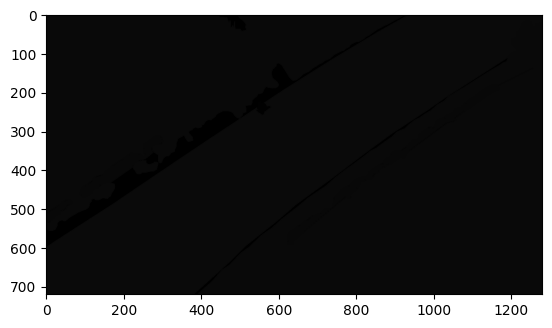

In [30]:
plt.imshow(mask)

In [31]:
class CustomSegDataset(Dataset):

    def __init__(self, *, image_size, num_classes, image_paths, mask_paths=None, is_train=False):

        self.image_size  = image_size
        self.image_paths = image_paths
        self.mask_paths  = mask_paths # None in case of test set where only images are available.
        self.num_classes = num_classes

        self.is_train = is_train

        self.transforms = self.setup_transforms()

    def __len__(self):
        return len(self.image_paths)

    def setup_transforms(self):
        # Preprocessing transform - Resize. Applied first to reduce memory and time required to apply other transforms.
        transforms = []

        # Augmentation to be applied to the training set.
        if self.is_train:
            transforms.extend([
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(),
                A.ShiftScaleRotate(scale_limit=0.2, rotate_limit=0, shift_limit=0.2, p=0.5, border_mode=0),])

        # Preprocess transforms - Normalization and converting to PyTorch tensor format (HWC --> CHW).
        transforms.extend([
            # The mean and std values are of the IMAGENET dataset and is utilized by every pretrained PyTorch model.
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], always_apply=True),

            ToTensorV2() # (H, W, C) --> (C, H, W)
        ])

        return A.Compose(transforms)

    def load_file(self, file_path, interpolation=cv2.INTER_NEAREST):
        file = cv2.imread(file_path, cv2.IMREAD_COLOR)[:, :, ::-1]
        file = cv2.resize(file, self.image_size, interpolation=interpolation)
        return file

    def __getitem__(self, index):

        # Get image and mask path.
        image_path = self.image_paths[index]

        # Load image using opencv and convert image format from BGR to RGB and resize.
        image = self.load_file(image_path, interpolation=cv2.INTER_CUBIC)

        if self.mask_paths is not None: # True for Training and validation set.
            # Get mask path.
            mask_path  = self.mask_paths[index]

            # Load mask using opencv and convert image format from BGR to RGB and resize.
            mask = self.load_file(mask_path, interpolation=cv2.INTER_NEAREST)



            # Apply Preprocessing (+ Augmentations) transformations to image-mask pair
            transformed = self.transforms(image=image, mask=mask)
            image, mask = transformed['image'], transformed['mask'].to(torch.long)
            return image, mask

        else: # For Test set.

            # Apply Preprocessing transformations to image.
            transformed = self.transforms(image=image)

            image = transformed['image']

            return image

## <font style="color:green">1.2. Visualize dataset</font>

In [32]:
id2color = {
    0 : (0,0,0),             # Background
    1 : (192, 128, 128),     # Person
    2 : (0, 128,0),          # Bike
    3 : (128,128,128),       # Car
    4 : (128, 0,0),          # Drone
    5 : (0, 0, 128),         # Boat
    6 : (192,0,128),         # Animal
    7 : (192, 0,0),          # Obstacle
    8 : (192, 128, 0),       # Construction
    9 : (0, 64, 0),          # Vegetation
    10: (128, 128, 0),       # Road
    11 : (0, 128, 128)       # Sky
}

# Reverse id2color mapping.
# Used for converting RGB mask to a single channel (grayscale) representation.
rev_id2color = {value: key for key, value in id2color.items()}

In [33]:
def grayscale_to_rgb(num_arr, color_map = id2color):
    gray_rgb_image = np.squeeze(num_arr)

    #collapse H,W dimension
    grayscale_array = gray_rgb_image[:, :, 0]

    #get an array of all unique pixels and 'inverse' with indices to the unique array which can be used to reconstruct the original array
    unique_pixels, inverse  = np.unique(grayscale_array, return_inverse = True)

    # Map unique grayscale values to RGB colors
    color_map = np.array([color_map.get(int(value), (0,0,0)) for value in unique_pixels])
    # Use the inverse indices to reconstruct the RGB image
    rgb_image = color_map[inverse].reshape(gray_rgb_image.shape)
    return np.float32(rgb_image) / 255.0 # return a floating point array in range [0.0, 1.0]

In [34]:
# Function to overlay a segmentation map on top of an RGB image.
def image_overlay(image, segmented_image):

    alpha = 1.0 # Transparency for the original image.
    beta  = 0.7 # Transparency for the segmentation map.
    gamma = 0.0 # Scalar added to each sum.

    segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR)

    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    image = cv2.addWeighted(image, alpha, segmented_image, beta, gamma, image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    return np.clip(image, 0.0, 1.0)

In [35]:
def display_image_and_mask(*, images, masks, color_mask=False, color_map=id2color):
    title = ['GT Image', 'GT Mask', 'Overlayed Mask']

    for idx in range(images.shape[0]):

        image = images[idx]
        grayscale_mask = masks[idx]

        plt.figure(figsize=(12, 8))

        # Create RGB segmentation map from grayscale segmentation map.
        rgb_gt_mask = grayscale_to_rgb(grayscale_mask)

        # Create the overlayed image.
        overlayed_image = image_overlay(image, rgb_gt_mask)

        # Plot image, segmentation map and overlayed image.
        plt.subplot(1, 3, 1)
        plt.title(title[0])
        plt.imshow(image)
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title(title[1])
        if color_mask:
            plt.imshow(rgb_gt_mask)
        else:
            plt.imshow(grayscale_mask)
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title(title[2])
        plt.imshow(overlayed_image)
        plt.axis('off')

        plt.show()
        plt.close()
    return

In [36]:
def get_dataloader(batch_size = 4, num_workers = 0, pin_memory = False):
    num_classes =  DatasetConfig.NUM_CLASSES
    # OpenCV .resize(..) method accepts new size in format (new_width, new_height).
    IMAGE_SIZE = (DatasetConfig.IMG_WIDTH, DatasetConfig.IMG_HEIGHT)
    #Training image and mask paths train_image_paths,train_mask_paths
    # Validation image and mask paths valid_image_paths,valid_mask_paths

    #create training dataset and dataloader
    train_dataset = CustomSegDataset(image_size = IMAGE_SIZE, image_paths = train_image_paths,mask_paths = train_mask_paths,is_train = True, num_classes= num_classes)

    train_loader = DataLoader(train_dataset,batch_size = batch_size,num_workers = num_workers,pin_memory = pin_memory,
                                  shuffle = True,drop_last = True)

    # Create validation dataset and dataloader.
    valid_dataset = CustomSegDataset(image_size = IMAGE_SIZE, image_paths = valid_image_paths,mask_paths = valid_mask_paths,is_train = False, num_classes= num_classes)

    valid_loader = DataLoader(valid_dataset,batch_size = batch_size,num_workers = num_workers,pin_memory = pin_memory,
                                  shuffle = False)

    return train_loader, valid_loader

In [37]:
train_loader, valid_loader = get_dataloader(batch_size = InferenceConfig.BATCH_SIZE)

In [38]:
print(len(train_loader))
print(len(valid_loader))

524
132


In [39]:
# This function is used for reversing the Normalization transformation applied during image preprocessing.
# Note the mean and std values must match the ones used.
def denormalize(tensors, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)):
    """Normalization parameters for pre-trained PyTorch models
    Denormalizes image tensors using mean and std"""

    for c in range(3):
        tensors[:, c, :, :].mul_(std[c]).add_(mean[c])

    return torch.clamp(tensors, min=0.0, max=1.0)

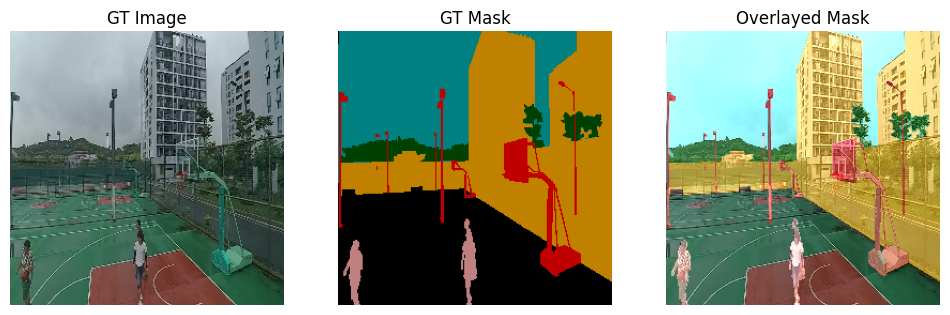

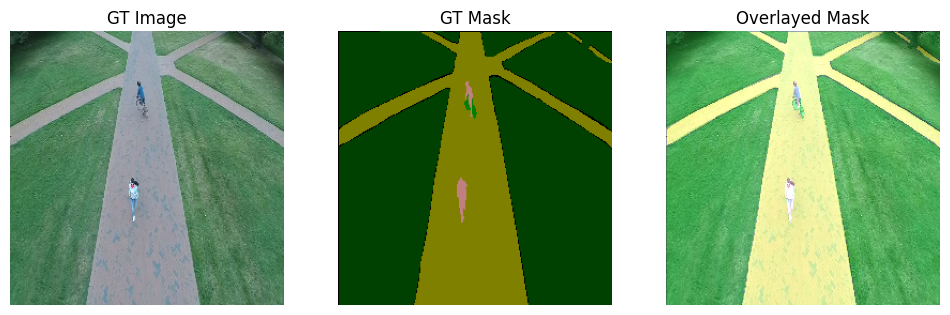

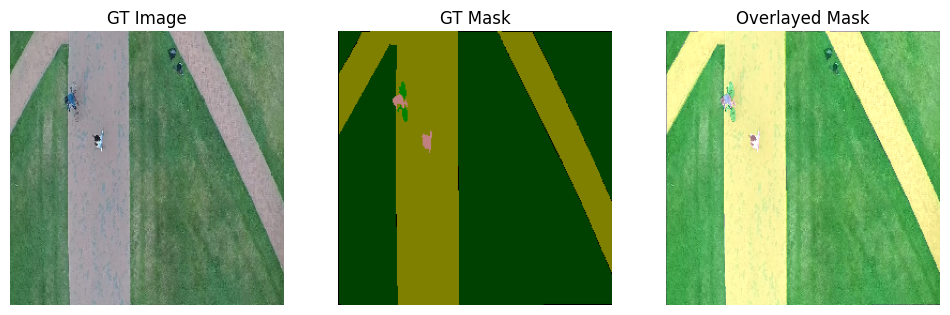

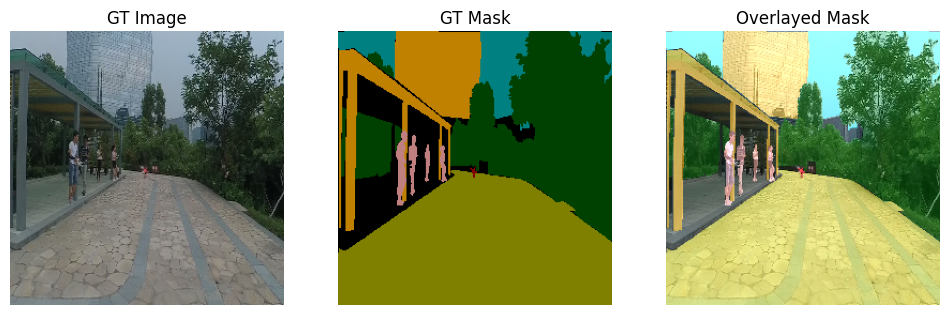

In [40]:
for batch_images, batch_masks in valid_loader:

    batch_images = denormalize(batch_images).permute(0, 2, 3, 1).numpy()
    batch_masks  = batch_masks.numpy()

    display_image_and_mask(images=batch_images, masks=batch_masks, color_mask=True)

    break

# <font style="color:green">2. Evaluation Metrics</font>

<p>The mean <a href='https://en.wikipedia.org/wiki/Sørensen–Dice_coefficient'>Dice coefficient</a
>. The Dice coefficient can be used to compare the pixel-wise agreement between a predicted segmentation and its corresponding ground truth. The formula is given by: </p>

<p>$$DSC =  \frac{2 |X \cap Y|}{|X|+ |Y|}$$
$$ \small \mathrm{where}\ X = Predicted\ Set\ of\ Pixels,\ \ Y = Ground\ Truth $$ </p>
<p>The Dice coefficient is defined to be 1 when both X and Y are empty.</p>

In [41]:
def mean_dice(predictions, ground_truths,num_classes,dims = (1,2)):
    # Convert  ground truth masks into one-hot encoded tensor.
    # Shape: [B, H, W] --> [B, H, W, num_classes]
    ground_truths = F.one_hot(ground_truths,num_classes =num_classes)
    # Converting unnormalized predictions into one-hot encoded across channels.
    # Shape: [B, H, W] --> [B, H, W, num_classes]
    predictions = F.one_hot(predictions,num_classes = num_classes)  #.permute(0, 2, 3, 1)
    #intersection |A ∩ B|. Shape: [B, num_classes]
    intersection = (predictions * ground_truths).sum(dim = dims)
    #Summation |A| + |B|. Shape: [B, num_classes].
    summation = predictions.sum(dim = dims) + ground_truths.sum(dim = dims)
    # Dice Shape: (batch_size, num_classes)
    dice = (2*intersection)/summation
    #Requirement: The Dice coefficient is defined to be 1 when both X and Y are empty.
    dice = torch.where(summation == 0, torch.ones_like(dice),dice)
    # As no smoothing is used we replace any 'nan' value that with 0.
    # With smoothing the results yields slightly different values.
    dice = torch.nan_to_num(dice, nan=0.0)
    # Shape: [batch_size,]
    num_classes = torch.count_nonzero(summation,dim = 1)
    # dice per image.
    # Average over the total number of classes present in ground_truths and predictions.
    # Shape: [batch_size,]
    dice = dice.sum(dim = 1) / num_classes
    # Compute the mean over the remaining axes (batch and classes).
    # Shape: Scalar
    dice_mean = dice.mean()

    return dice_mean

In [42]:
#Loss function Combo loss Dice + cross entropy loss
def dice_coef_loss(predictions, ground_truths, num_classes=12, dims = (1, 2), smooth=1e-8):
    """
    Calculate a combined loss function comprising the Naive Dice coefficient loss and cross-entropy loss.

    Arguments:
    predictions (torch.tensor): Prediction (P) model output logits.
                                Shape: [batch_size(B), num_classes, height(H), width(W)]

    ground_truths (torch.tensor): Ground truth mask (G). [B, num_classes, H, W].

    dims (tuple): Dimensions corresponding to image height and width in a tensor shape: [B, H, W, num_classes].

    Returns:
    torch.tensor: A scalar tensor representing the combined Naive Mean Dice coefficient and cross-entropy loss.
    """

    # Convert single channel ground truth masks into one-hot encoded tensor.
    # Shape: (B, H, W, num_classes)
    ground_truth_oh = F.one_hot(ground_truths, num_classes=num_classes)
    # Normalize model predictions and transpose.
    # Shape :: [B, num_classes, H, W] --> [B, H, W, num_classes]
    # This is done to match the shape of ground_truth_oh.
    prediction_norm = F.softmax(predictions, dim=1).permute(0, 2, 3, 1)

    # Intersection: |G ∩ P|. Shape: [B, num_classes]
    intersection = (prediction_norm * ground_truth_oh).sum(dim=dims)

    # Summation: |G| + |P|. Shape: [B, num_classes].
    summation = (prediction_norm.sum(dim=dims) + ground_truth_oh.sum(dim=dims))

    # Dice Shape: [B, num_classes]
    dice = (2.0 * intersection + smooth) / (summation + smooth)
    # Replace NaN values with 1 where both prediction and ground truth are empty
    dice = torch.where(summation == 0, torch.ones_like(dice), dice)

    # Compute the mean over the remaining axes (batch and classes).
    dice_mean = dice.mean()

    # Compute cross-entropy loss.
    CE = F.cross_entropy(predictions, ground_truths)

    return (1.0 - dice_mean) + CE

# <font style="color:green">3. Model</font>

In [43]:
def prepare_model(model_name="deeplabv3_resnet50", use_pretrained=True, num_classes=2):
    WEIGHTS = "DEFAULT" if use_pretrained else None

    try:
        print(f"Loading model: {model_name}, Use pretrained? {use_pretrained}")
        model = getattr(segmentation, model_name.lower())(weights=WEIGHTS, aux_loss=ModelConfig.AUX_LOSS)

    except Exception as e:
        print(e)
        print("\nLoading pretrained DeepLabV3 model with a resnet50 backbone.")
        model = segmentation.deeplabv3_resnet50(weights="DEFAULT")


    if "lraspp" in model_name.lower():
        # Updating the out_channels of the low and high classifer layers in the LRASPP model.
        model.low_classifier  = nn.Conv2d(in_channels=40, out_channels=num_classes, kernel_size=1, stride=1)
        model.high_classifier = nn.Conv2d(in_channels=128, out_channels=num_classes, kernel_size=1, stride=1)
    else:
        # Update the number of output channels to num_classes in the final layer in the main path.
        model.classifier[-1] = nn.LazyConv2d(out_channels=num_classes, kernel_size=1, stride=1)

        if use_pretrained: # Auxilary branch is absent if pretrained model is not loaded.

            if ModelConfig.AUX_LOSS:
                # Update the number of output channels to num_classes in the final layer of the auxiliary branch.
                model.aux_classifier[-1] = nn.LazyConv2d(out_channels=num_classes, kernel_size=1, stride=1)
            else:
                # Removing auxiliary classifier block.
                model.aux_classifier = nn.Identity()
    return model

In [44]:
model = prepare_model(
    model_name=ModelConfig.MODEL_NAME,
    use_pretrained=ModelConfig.USE_PRETRAINED,
    num_classes=DatasetConfig.NUM_CLASSES,
)
model.eval()

summary(model, input_size=(1, 3, DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH))

Loading model: deeplabv3_resnet101, Use pretrained? True


Downloading: "https://download.pytorch.org/models/deeplabv3_resnet101_coco-586e9e4e.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet101_coco-586e9e4e.pth
100%|██████████| 233M/233M [00:01<00:00, 234MB/s]


Layer (type:depth-idx)                             Output Shape              Param #
DeepLabV3                                          [1, 12, 256, 256]         --
├─IntermediateLayerGetter: 1-1                     [1, 2048, 32, 32]         --
│    └─Conv2d: 2-1                                 [1, 64, 128, 128]         9,408
│    └─BatchNorm2d: 2-2                            [1, 64, 128, 128]         128
│    └─ReLU: 2-3                                   [1, 64, 128, 128]         --
│    └─MaxPool2d: 2-4                              [1, 64, 64, 64]           --
│    └─Sequential: 2-5                             [1, 256, 64, 64]          --
│    │    └─Bottleneck: 3-1                        [1, 256, 64, 64]          75,008
│    │    └─Bottleneck: 3-2                        [1, 256, 64, 64]          70,400
│    │    └─Bottleneck: 3-3                        [1, 256, 64, 64]          70,400
│    └─Sequential: 2-6                             [1, 512, 32, 32]          --
│    │    └─Bottlen

# <font style="color:green">4. Train & Inference</font>



In [45]:
def train_one_epoch(model, loader, optimizer, scaler, num_classes, device= 'cpu', epochs_idx =0 , total_epochs=80):
    model.train()
    loss_record = MeanMetric()
    metric_record  = MeanMetric()
    acc_record = MulticlassAccuracy(num_classes = num_classes, average = 'micro')

    # Store IoU per class
    iou_per_class = np.zeros(num_classes)

    loader_len = len(loader)

    with tqdm(total = loader_len, ncols = 122) as tq:
        tq.set_description(f"Train :: Epoch: {epochs_idx}/{total_epochs}")

        for data,mask in loader:
            tq.update(1)
            #send data and mask to GPU if available
            data,mask = data.to(device), mask.to(device)
            #collapse H,W dimension
            mask = mask[:, :,:, 0]  # Collapse H, W dimension
            #reset parameter gradients to zero
            optimizer.zero_grad()

            # Autocasting for mixed-precision training.
            with amp.autocast():
                #perform forward pass through the model. Output is a dictionary
                output_dict = model(data)
                # Classifier head output
                cls_out = output_dict['out']
               # Calculate Combo loss (Segmentation specific loss (Dice) + cross entropy)
                loss = dice_coef_loss(cls_out, mask, num_classes=num_classes)
                # Auxiliary head output
                aux_out = output_dict['aux']
                # Calculate simple cross entropy loss for auxiliary head output.
                aux_loss = dice_coef_loss(aux_out, mask, num_classes=num_classes)
                # A weighted combination between classifier and auxiliary head loss.
                loss += ModelConfig.AUX_WEIGHT * aux_loss

            # Calculate gradients w.r.t training parameters on scaled loss.
            scaler.scale(loss).backward()
            # Update parameters using gradients
            scaler.step(optimizer)
            # Updates the scale for the next iteration.
            scaler.update()
            # Detach Classifier head output logits tensor from graph.
            #Detaching a tensor from the computation graph in PyTorch means that you're creating a new tensor t
            #hat shares the same data as the original tensor but doesn't require gradients.
            cls_out = cls_out.detach()
            # Get the index across channel axis of the max logit score.
            # We can directly call argmax because: Softmax(logit).argmax() == logit.argmax()
            pred_idx = cls_out.argmax(dim = 1)


            # Compute IoU for each class
            for cls in range(num_classes):
                iou_per_class[cls] += jaccard_score((mask == cls).cpu().flatten(),
                                                    (pred_idx == cls).cpu().flatten(),
                                                    average='binary', zero_division=0)

            # Calculate Segmentation specific metric (Dice).
            metric = mean_dice(pred_idx, mask, num_classes)
            # Record and calculate batch accuracy using torchmetrics.
            acc_record.update(pred_idx.cpu(), mask.cpu())
            # Record loss and Dice metric.
            loss_record.update(loss.detach().cpu(), weight=data.shape[0])
            metric_record.update(metric.cpu(),weight=data.shape[0])

            # Update progress bar description.
            tq.set_postfix_str(s=f"Loss: {loss_record.compute():.4f}, Dice: {metric_record.compute():.4f}, Acc: {acc_record.compute():.4f}")

            # Free up memory
            del data, mask, output_dict, cls_out, pred_idx, metric
            torch.cuda.empty_cache()

    iou_per_class /= loader_len  # Compute mean IoU for each class
    mean_iou = np.mean(iou_per_class)  # Mean IoU over all classes

    # Get mean loss, accuracy and Dice score.
    epoch_loss   = loss_record.compute()
    epoch_metric = metric_record.compute()
    epoch_acc    = acc_record.compute()
    return epoch_loss, epoch_metric, epoch_acc, iou_per_class, mean_iou

In [46]:
def validation(model, loader, num_classes, device= 'cpu', epochs_idx=0 , total_epochs=80):
    model.eval()
    loss_record = MeanMetric()
    metric_record  = MeanMetric()
    acc_record = MulticlassAccuracy(num_classes = num_classes, average = 'micro')

    iou_per_class = np.zeros(num_classes)

    loader_len = len(loader)

    with tqdm(total = loader_len, ncols = 122) as tq:
        tq.set_description(f"Train :: Epoch: {epochs_idx}/{total_epochs}")

        for data, mask in loader:
            tq.update(1)
            # Send data and mask to GPU if available
            data,mask = data.to(device), mask.to(device)
            # Collapse H,W dimension
            mask = mask[:, :,:, 0]

            with torch.no_grad():
                # Perform forward pass through the model. Output is a dictionary
                output_dict = model(data)
                # Classifier head output
                cls_out = output_dict['out']
                # Calculate Combo loss (Segmentation specific loss (Dice) + cross entropy)
                loss = dice_coef_loss(cls_out, mask, num_classes=num_classes)

            # Get the index across channel axis of the max logit score.
            # Can directly call argmax because: Softmax(logit).argmax() == logit.argmax()
            pred_idx = cls_out.argmax(dim = 1)

            # Compute IoU for each class
            for cls in range(num_classes):
                iou_per_class[cls] += jaccard_score((mask == cls).cpu().flatten(),
                                                    (pred_idx == cls).cpu().flatten(),
                                                    average='binary', zero_division=0)

            # Calculate Segmentation specific metric (Dice).
            metric = mean_dice(pred_idx, mask, num_classes)
            # Record and calculate batch accuracy using torchmetrics.
            acc_record.update(pred_idx.cpu(), mask.cpu())
            # Record loss and Dice metric.
            loss_record.update(loss.detach().cpu(), weight=data.shape[0])
            metric_record.update(metric.cpu(),weight=data.shape[0])

            # Free up memory
            del data, mask, output_dict, cls_out, pred_idx, metric
            torch.cuda.empty_cache()

        iou_per_class /= loader_len  # Compute mean IoU per class
        mean_iou = np.mean(iou_per_class)  # Mean IoU across all classes

        # Get mean loss, accuracy and Dice score.
        valid_epoch_loss   = loss_record.compute()
        valid_epoch_metric = metric_record.compute()
        valid_epoch_acc    = acc_record.compute()
        # Update progress bar description.
        tq.set_postfix_str(s=f"Loss: {valid_epoch_loss:.4f}, Dice: {valid_epoch_metric:.4f}, Acc: {valid_epoch_acc:.4f}")

    return valid_epoch_loss, valid_epoch_metric, valid_epoch_acc, iou_per_class, mean_iou

In [47]:
def plot_iou_scores(iou_history, mean_iou_history):

    plt.figure(figsize=(12, 6))

    for cls in range(len(iou_history)):
        plt.plot(iou_history[cls], label=f"Class {cls}")

    plt.plot(mean_iou_history, color='black', linestyle='dashed', linewidth=2, label="Mean IoU")

    plt.xlabel("Epoch")
    plt.ylabel("IoU Score")
    plt.title("IoU per Class and Mean IoU Over Epochs")
    plt.legend()
    plt.grid()
    plt.show()

In [48]:
#Main Function for Training
def main(*, model, optimizer, ckpt_dir, pin_memory=False, device="cpu"):
    # Create Dataloader.
    train_loader, valid_loader = get_dataloader(batch_size=TrainingConfig.BATCH_SIZE, pin_memory=pin_memory,
                                                num_workers=TrainingConfig.NUM_WORKERS)

    # Save the model if best_loss improves.
    best_loss = float("inf")
    # Plot training and validation epoch logs and
    # prints min, max, current stats of all variable being tracked.
    live_plot = PlotLosses(outputs=[MatplotlibPlot(cell_size=(8, 3)), ExtremaPrinter()])
    total_epochs = TrainingConfig.EPOCHS
    # Creates a GradScaler once at the beginning of training
    # for automatic mixed precision training.
    scaler = amp.GradScaler()

    # Early stopping parameters
    patience = 10  # Number of epochs to wait for improvement
    patience_counter = 0

    iou_history = {cls: [] for cls in range(DatasetConfig.NUM_CLASSES)}
    mean_iou_history = []

    #Training loop
    for epoch in range(total_epochs+1):
        # Memory Cleanup.
        torch.cuda.empty_cache()
        gc.collect()

        #train one epoch
        train_loss, train_metric, train_accuracy, train_iou, train_mean_iou = train_one_epoch(model = model, loader = train_loader, optimizer = optimizer, scaler = scaler,
                                                                  num_classes = DatasetConfig.NUM_CLASSES, device = device, epochs_idx = epoch,total_epochs = total_epochs )
        # Peform model validation.
        valid_loss, valid_metric, valid_accuracy, valid_iou, valid_mean_iou = validation(model = model, loader = valid_loader, device = device, num_classes = DatasetConfig.NUM_CLASSES,
                                                              epochs_idx = epoch, total_epochs = total_epochs )

        for cls in range(DatasetConfig.NUM_CLASSES):
          iou_history[cls].append(valid_iou[cls])
        mean_iou_history.append(valid_mean_iou)

        # Plot train and validation statistics.
        live_plot.update({
                "loss": train_loss,
                "val_loss": valid_loss,
                "accuracy": train_accuracy,
                "val_accuracy": valid_accuracy,
                "dice": train_metric,
                "val_dice": valid_metric,
        })

        live_plot.send()

        # Create model and optimizer checkpoint.
        if valid_loss < best_loss:
            best_loss = valid_loss
            print("Model Improved. Saving...", end="")

            checkpoint_dict = {
                "opt": optimizer.state_dict(),
                "model": model.state_dict(),
                "scaler": scaler.state_dict(),
            }
            torch.save(checkpoint_dict, os.path.join(ckpt_dir, "ckpt.tar"))
            del checkpoint_dict
            print("Done.\n")

        else:
            patience_counter += 1
            print(f"No improvement. Patience counter: {patience_counter}/{patience}")

        # Check for early stopping
        if patience_counter >= patience:
            print("Early stopping triggered. Stopping training.")
            break

    # Plot IoU Scores
    plot_iou_scores(iou_history, mean_iou_history)

    return

In [49]:
def create_checkpoint_dir(checkpoint_dir):
    # Create a new checkpoint directory every time.
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)

    try:
        num_versions = [int(i.split("_")[-1]) for i in os.listdir(checkpoint_dir) if "version" in i]
        version_num = max(num_versions) + 1
    except:
        version_num = 0

    version_dir = os.path.join(checkpoint_dir, "version_" + str(version_num))
    os.makedirs(version_dir)

    print(f"Checkpoint directory: {version_dir}")
    return version_dir

In [50]:
# For deterministic training
seed_everything(seed_value=41)

# Set default device to GPU if available.
DEVICE, GPU_AVAILABLE = get_default_device()
# Setup Model Checkpoint directory.
CKPT_DIR = create_checkpoint_dir(TrainingConfig.CHECKPOINT_DIR)
# Send model to device (GPU/CPU)
model.to(DEVICE)
# Dummy pass through the model to initalize parameters.
_ = model(torch.randn((2, 3, DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH), device=DEVICE))
# Initialize Optimizer
optimizer = Adam(
    model.parameters(),
    lr=TrainingConfig.LEARNING_RATE,
    amsgrad=True,
    fused=True,
)

Checkpoint directory: model_checkpoint/DeepLabv3_AeroScapes_Dice_Loss/version_0


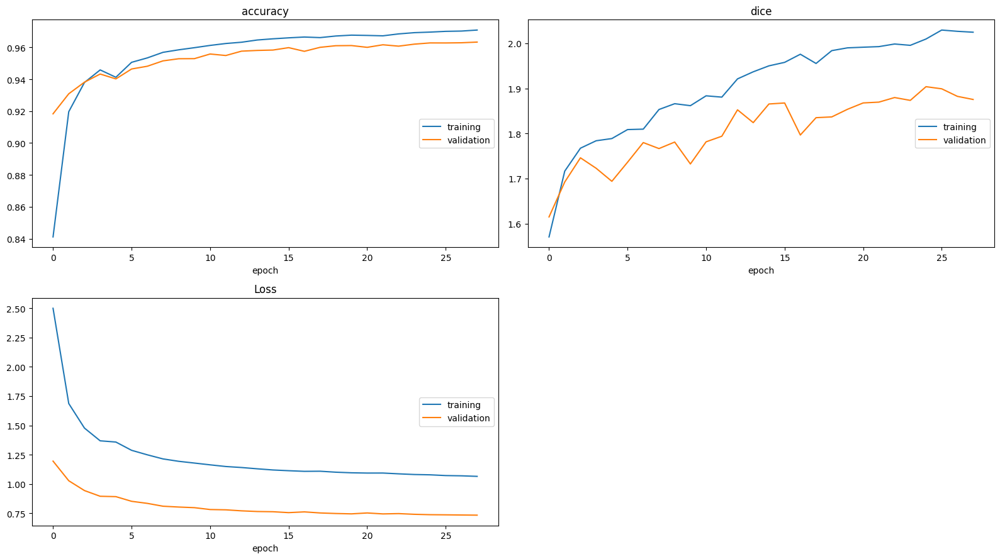

accuracy
	training         	 (min:    0.841, max:    0.971, cur:    0.971)
	validation       	 (min:    0.918, max:    0.963, cur:    0.963)
dice
	training         	 (min:    1.571, max:    2.029, cur:    2.025)
	validation       	 (min:    1.615, max:    1.904, cur:    1.875)
Loss
	training         	 (min:    1.066, max:    2.499, cur:    1.066)
	validation       	 (min:    0.735, max:    1.196, cur:    0.735)
Model Improved. Saving...Done.



Train :: Epoch: 28/30:   0%|▏                                                             | 1/262 [00:00<03:16,  1.33it/s]/tmp/ipython-input-45-2872480253.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Train :: Epoch: 28/30:   1%|▏                    | 2/262 [00:02<05:01,  1.16s/it, Loss: 1.0115, Dice: 1.7991, Acc: 0.9663]/tmp/ipython-input-45-2872480253.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Train :: Epoch: 28/30:   1%|▏                    | 3/262 [00:03<05:04,  1.18s/it, Loss: 1.0208, Dice: 1.8222, Acc: 0.9684]/tmp/ipython-input-45-2872480253.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Train :: Epoch: 28/30:   2%|▎                    | 4/262 [00:04<05:06,  1.19

In [ ]:
main(
    model=model,
    optimizer=optimizer,
    ckpt_dir=CKPT_DIR,
    device=DEVICE,
    pin_memory=GPU_AVAILABLE,
)


## <font style="color:green">4.2. Inference</font>


In [ ]:
for dirname, _, filenames in os.walk('./' + TrainingConfig.CHECKPOINT_DIR):
   # print(filenames)
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
checkpoint = torch.load(os.path.join(CKPT_DIR, "ckpt.tar"), map_location='cpu')
model.load_state_dict(checkpoint['model'])
model.to(DEVICE)
model.eval()

In [ ]:
# Function to convert a single channel mask representation to an RGB mask.
def num_to_rgb(num_arr, color_map=id2color):
    single_layer = np.squeeze(num_arr)
    output = np.zeros(num_arr.shape[:2] + (3,))

    for k in color_map.keys():
        output[single_layer == k] = color_map[k]

    return np.float32(output) / 255.0 # return a floating point array in range [0.0, 1.0]

In [ ]:
@torch.inference_mode()
def inference_for_validation(model, loader, device="cpu"):
    num_batches_to_process = InferenceConfig.NUM_BATCHES

    for idx, (batch_img, batch_mask) in enumerate(loader):
        pred_all = model(batch_img.to(device))['out']
        pred_all = pred_all.cpu().argmax(dim=1).numpy()

        batch_img = denormalize(batch_img.cpu()).permute(0, 2, 3, 1).numpy()

        if idx == num_batches_to_process:
            break

        for i in range(0, len(batch_img)):
            fig = plt.figure(figsize=(20, 8))

            # Display the original image.
            ax1 = fig.add_subplot(1, 4, 1)
            ax1.imshow(batch_img[i])
            ax1.title.set_text("Actual frame")
            plt.axis("off")

            # Display the ground truth mask.
            true_mask_rgb = grayscale_to_rgb(batch_mask[i], color_map=id2color)
            ax2 = fig.add_subplot(1, 4, 2)
            ax2.set_title("Ground truth labels")
            ax2.imshow(true_mask_rgb)
            plt.axis("off")

            # Display the predicted segmentation mask.
            pred_mask_rgb = num_to_rgb(pred_all[i], color_map=id2color)
            ax3 = fig.add_subplot(1, 4, 3)
            ax3.set_title("Predicted labels")
            ax3.imshow(pred_mask_rgb)
            plt.axis("off")

            # Display the predicted segmentation mask overlayed on the original image.
            overlayed_image = image_overlay(batch_img[i], pred_mask_rgb)
            ax4 = fig.add_subplot(1, 4, 4)
            ax4.set_title("Overlayed image")
            ax4.imshow(overlayed_image)
            plt.axis("off")

            plt.show()

        # Free up memory
        del batch_img, batch_mask, pred_all

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

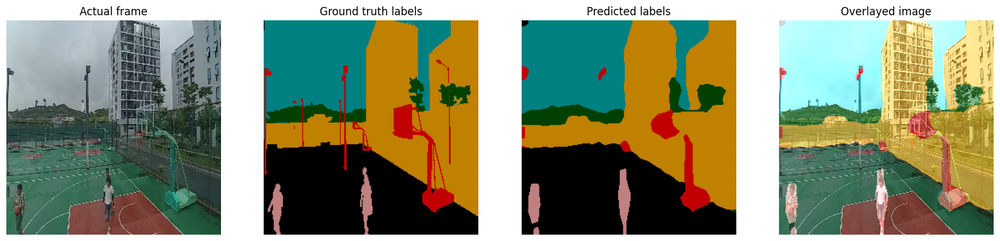

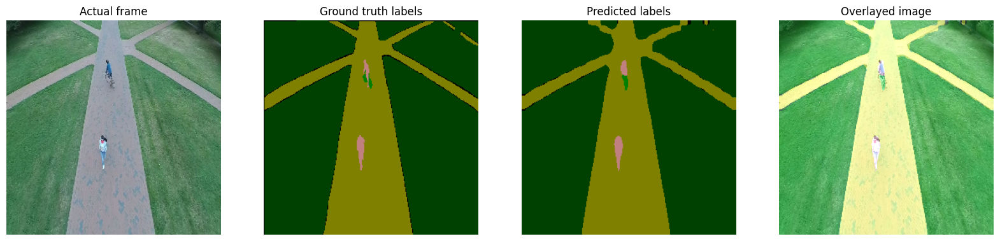

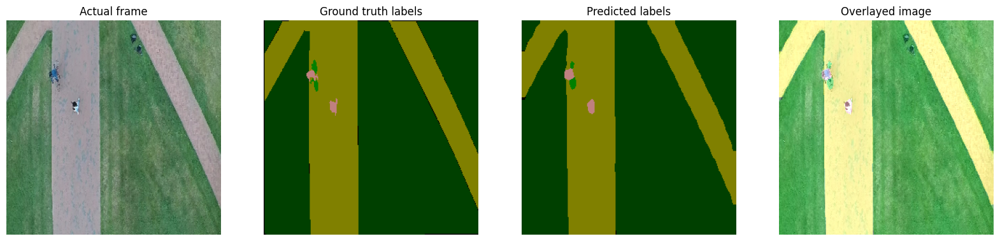

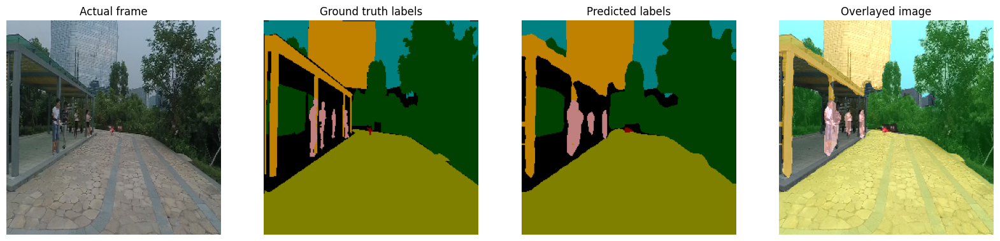

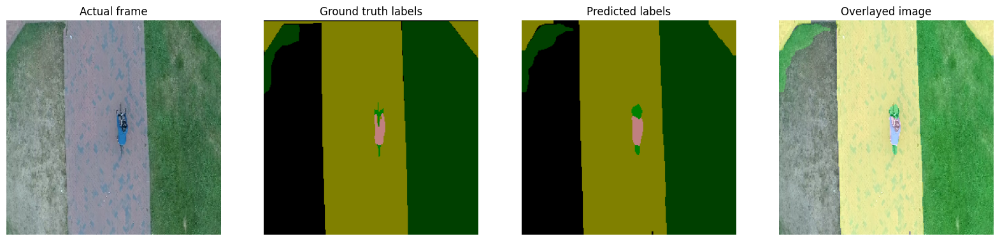

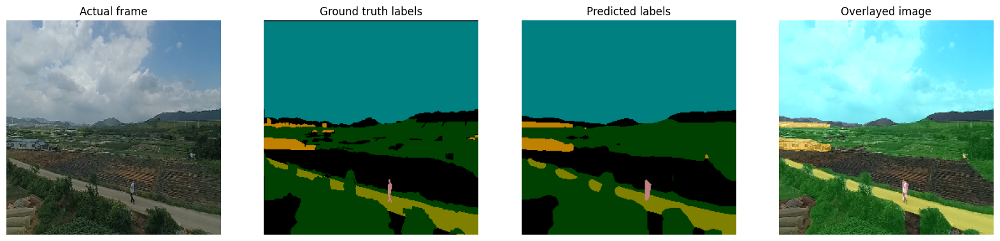

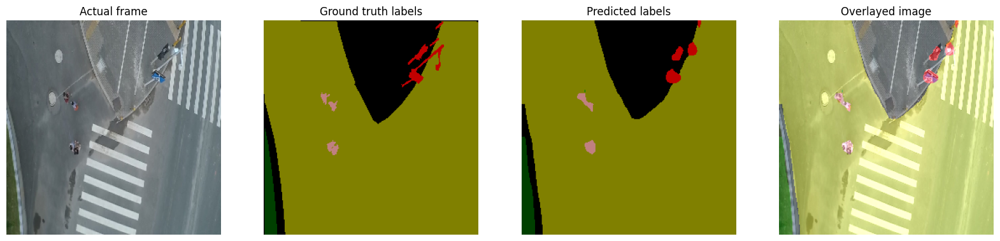

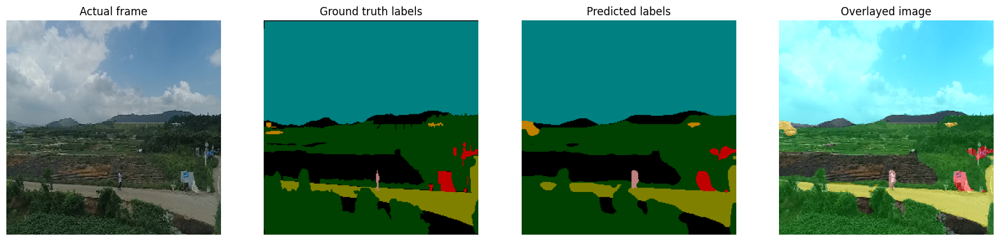

In [56]:
inference_for_validation(model, valid_loader, device=DEVICE)

# <font style="color:green">5. Prepare Submission CSV</font>
[The Encoded Pixels.](https://medium.com/analytics-vidhya/generating-masks-from-encoded-pixels-semantic-segmentation-18635e834ad0)

In [ ]:
test_csv_path = os.path.join(root_dir,'test.csv')
testdata_df = pd.read_csv(test_csv_path)

In [ ]:
test_images,_ = get_paths_for_images_and_masks(image_path, mask_path = None, df = testdata_df)

In [59]:
image = cv2.imread(test_images[100])
print(image.shape)

(720, 1280, 3)


In [60]:
len(test_images)

648

In [61]:
def get_testloader(batch_size = 1, num_workers = TrainingConfig.NUM_WORKERS, pin_memory = False):
    num_classes =  DatasetConfig.NUM_CLASSES
    IMAGE_SIZE = (DatasetConfig.IMG_WIDTH, DatasetConfig.IMG_HEIGHT)
    #create test dataset and dataloader
    test_dataset = CustomSegDataset(image_size = IMAGE_SIZE, image_paths = test_images, mask_paths = None, is_train = False, num_classes = num_classes)
    test_loader = DataLoader(test_dataset, batch_size = batch_size,num_workers = num_workers,pin_memory = pin_memory,
                                  shuffle = False)

    return test_loader

In [62]:
test_loader = get_testloader()

In [63]:
len(test_loader)

648

In [64]:
testdata_df.iloc[0]['ImageID']

np.uint64(9743172603816335085)

In [65]:
def resize_mask(mask, original_size):
    """
    Resize the mask to the original image size.
    """
    mask_image = Image.fromarray(mask.astype(np.uint8))
    resized_mask = mask_image.resize(original_size, Image.NEAREST)
    return np.array(resized_mask)

In [66]:
def masks2rles(masks,image_id, num_classes,):
    '''
    masks: numpy array of shape (batch_size, height, width) with integer class values (0, 1, 2, ..., num_classes-1)
    num_classes: the number of classes in the mask
    Returns a list of dictionaries, each containing class ids as keys and RLE strings as values for each mask
    '''
    rle_dict = {}
    for cls in range(num_classes):
        cls_image_id = f"{image_id}_{cls}"
        cls_mask = (masks == cls).astype(np.uint8)
        rle = ''
        pixels = cls_mask.flatten()
        # Add a zero at the beginning and end to ensure the RLE encoding captures the edges correctly
        pixels = np.concatenate([[0], pixels, [0]])
        # Find Run Start and End Points. Find where the pixel value changes
        runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
        # Adjust run lengths
        # runs[::2] selects every other element starting from the first, i.e., [2, 7] (start positions).
        # runs[1::2] selects every other element starting from the second, i.e., [5, 9] (end positions).
        # Subtraction runs[1::2] -= runs[::2] changes the end positions to lengths
        runs[1::2] -= runs[::2]
        # Convert to string format
        rle = ' '.join(str(x) for x in runs)
        rle_dict[cls_image_id] = rle

    return rle_dict

In [67]:
@torch.inference_mode()
def inference_for_test(model, loader, device="cpu"):
    count = 0
    result = []

    for idx, batch_img in enumerate(loader):
        pred_all = model(batch_img.to(device))['out']
        pred_all = pred_all.cpu().argmax(dim=1).numpy()
        image_id = testdata_df.iloc[idx]['ImageID']

        for i in range(pred_all.shape[0]):

            resized_mask = resize_mask(pred_all[i], (1280,720))
            rle = masks2rles(resized_mask,image_id,num_classes = 12,)
            for cls_image_id, encoded_string in rle.items():
                result.append({"ImageID": cls_image_id, "EncodedPixels": encoded_string if encoded_string else ""})

        batch_img = denormalize(batch_img.cpu()).permute(0, 2, 3, 1).numpy()

        if count<10:
            count+=1
            for i in range(0, len(batch_img)):
                fig = plt.figure(figsize=(20, 8))

                # Display the original image.
                ax1 = fig.add_subplot(1, 3, 1)
                ax1.imshow(batch_img[i])
                ax1.title.set_text("Actual frame")
                plt.axis("off")

                # Display the predicted segmentation mask.
                pred_mask_rgb = num_to_rgb(pred_all[i], color_map=id2color)
                ax3 = fig.add_subplot(1, 3, 2)
                ax3.set_title("Predicted labels")
                ax3.imshow(pred_mask_rgb)
                plt.axis("off")

                # Display the predicted segmentation mask overlayed on the original image.
                overlayed_image = image_overlay(batch_img[i], pred_mask_rgb)
                ax4 = fig.add_subplot(1, 3, 3)
                ax4.set_title("Overlayed image")
                ax4.imshow(overlayed_image)
                plt.axis("off")

                plt.show()

        # Free up memory
        del batch_img, pred_all,rle

    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return result

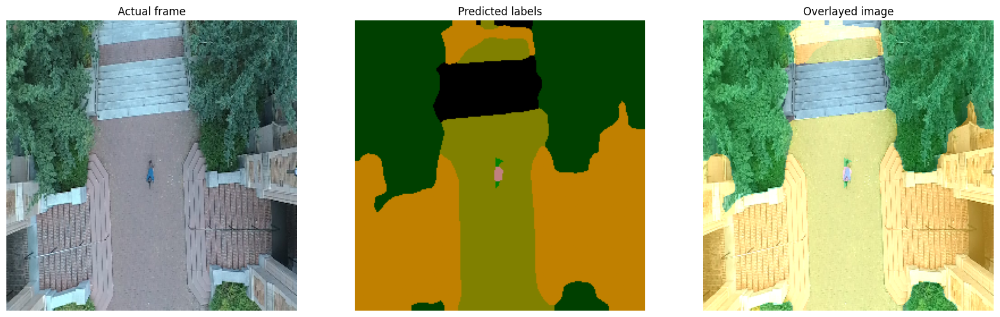

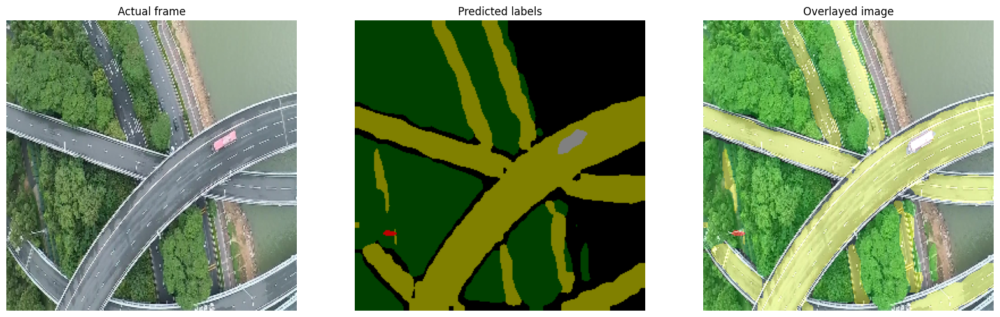

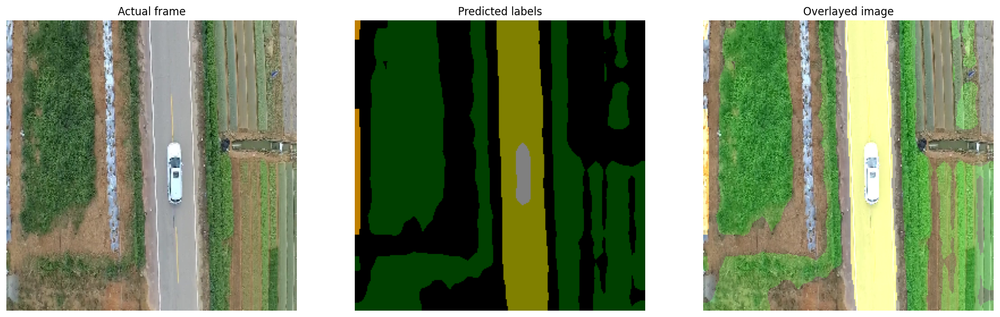

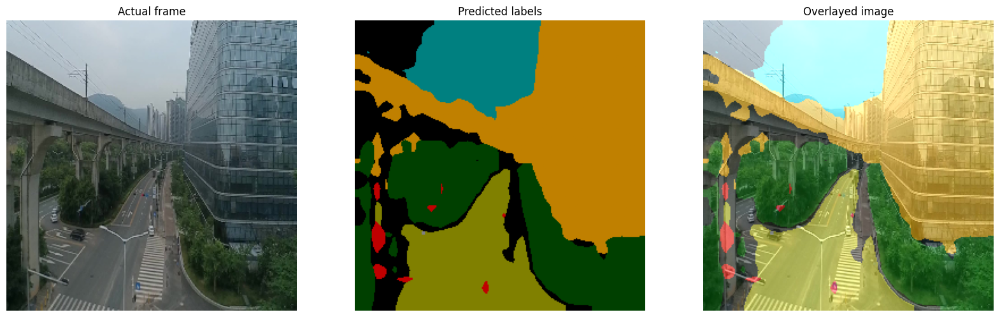

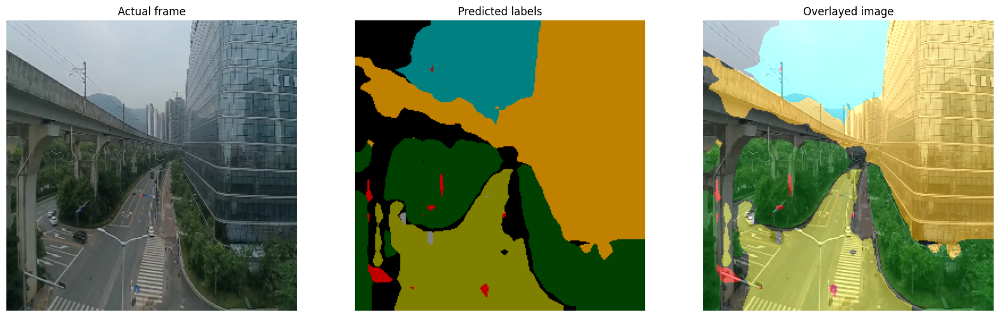

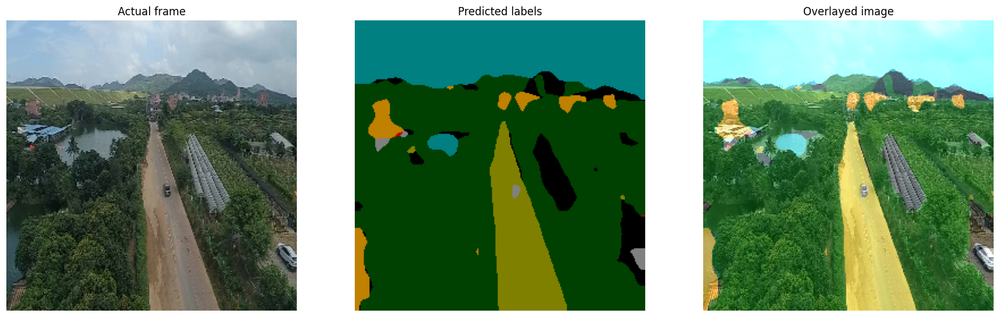

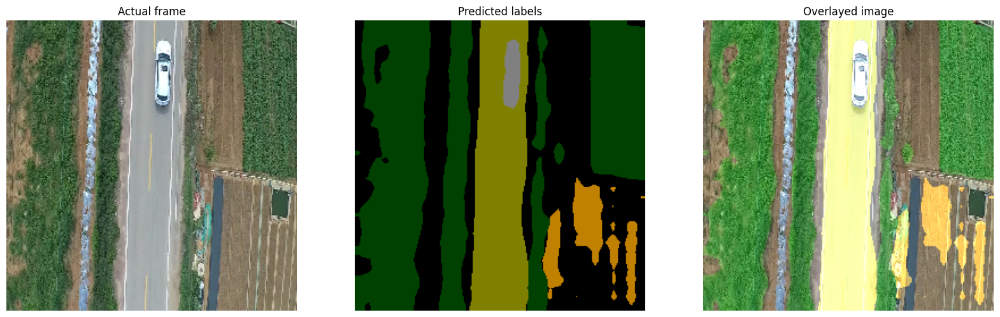

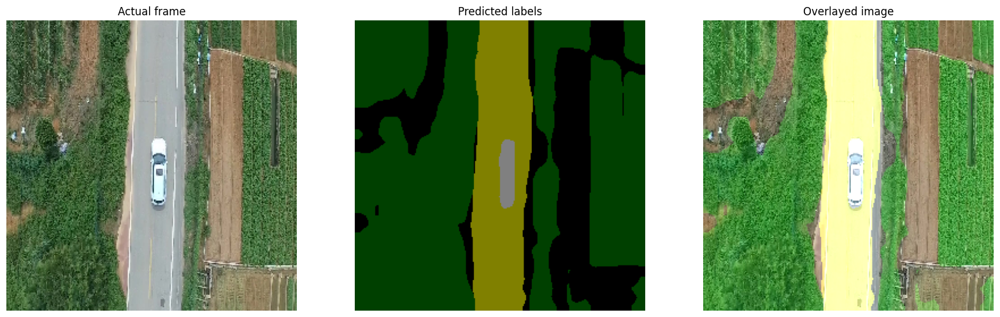

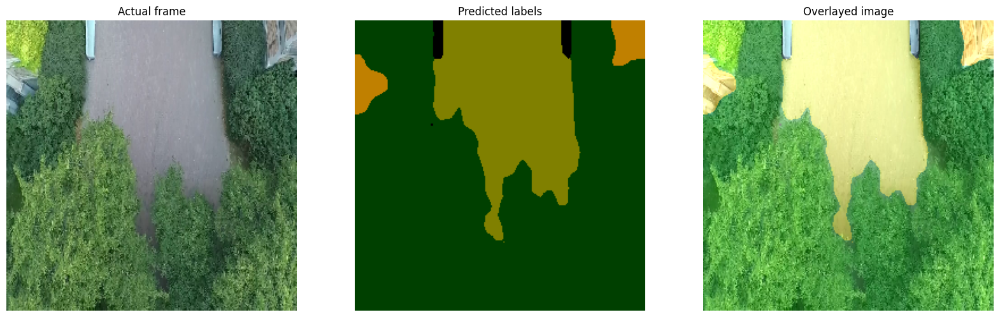

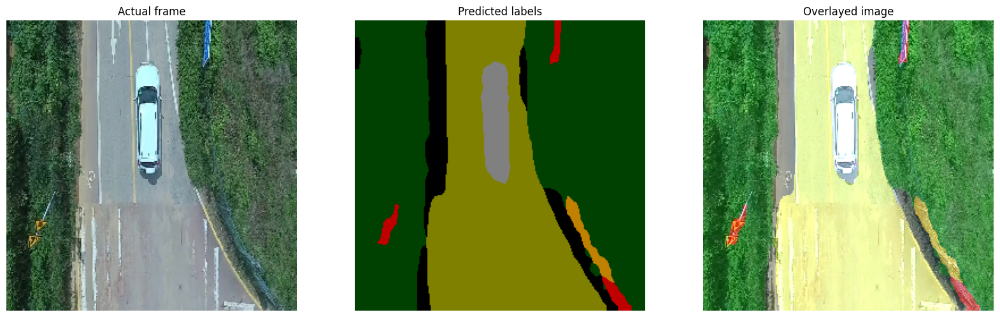

In [68]:
test_data = inference_for_test(model, test_loader, DEVICE)

In [69]:
len(test_data)

7776

In [70]:
submission = pd.DataFrame(test_data)
file_path = 'submission.csv'

In [71]:
len(submission)

7776

In [72]:
submission.head()

,ImageID,EncodedPixels
0,9743172603816335085_0,536 20 616 170 1816 20 1896 170 3096 20 3176 1...
1,9743172603816335085_1,465261 20 466541 20 467821 20 469101 25 470381...
2,9743172603816335085_2,435821 5 437101 5 438381 5 439661 20 440941 20...
3,9743172603816335085_3,
4,9743172603816335085_4,


In [73]:
submission.to_csv(file_path, index=False, na_rep='')
print(f"Submission file {file_path} created.")

Submission file submission.csv created.
